# Reading in and processing the satellite data

In [21]:
! pip install /Users/ariane/Documents/code/remseno/dist/remseno-0.0.1.tar.gz

https://www.envidat.ch/#/metadata/pfynwald

Processing /Users/ariane/Documents/code/remseno/dist/remseno-0.0.1.tar.gz
  Preparing metadata (setup.py) ... done


  Created wheel for remseno: filename=remseno-0.0.1-py3-none-any.whl size=49191 sha256=734b39c36b0c708d45261812628ecabe01749ed942e55463d7a88d1c916457d2
  Stored in directory: /Users/ariane/Library/Caches/pip/wheels/d6/dc/60/90822bf7a588c586397c0d67b4da6cb9f75f949c74ed65b439
Successfully built remseno
  Attempting uninstall: remseno
    Found existing installation: remseno 0.0.1
    Uninstalling remseno-0.0.1:
      Successfully uninstalled remseno-0.0.1


In [151]:
# First we need to map between the satellite and the files

import pandas as pd
import os

data_dir = '../data/tallo/planetscope/'
df = pd.read_csv(f'{data_dir}download_DF_dedup.csv')
sat_files = os.listdir(f'{data_dir}sat_data/')
df

,Unnamed: 0,latitude,longitude,tree_id,division,family,genus,species,stem_diameter_cm,height_m,crown_radius_m,binary_label,x0,x1,y0,y1,polygon_90m,image_ids
0,0,-43.2561,146.9190,T_498824,Angiosperm,Myrtaceae,Eucalyptus,Eucalyptus globulus,554.000000,82.300000,NaN,0,-43.256662,-43.255538,146.918595,146.919405,"[(146.9185945945946, -43.2555375), (146.918594...",20230113_230929_43_241e
1,1,-42.9662,146.7574,T_498779,Angiosperm,Myrtaceae,Eucalyptus,Eucalyptus globulus,388.000000,85.100000,NaN,0,-42.966763,-42.965637,146.756995,146.757805,"[(146.75699459459457, -42.9656375), (146.75699...",20230113_230924_81_241e
2,4,-42.8000,147.6000,T_332054,Angiosperm,Myrtaceae,Eucalyptus,Eucalyptus globulus,20.933333,20.500000,NaN,0,-42.800562,-42.799438,147.599595,147.600405,"[(147.59959459459458, -42.799437499999996), (1...",20221226_230459_63_2465
3,6,-38.4000,145.9000,T_332135,Angiosperm,Myrtaceae,Eucalyptus,Eucalyptus globulus,24.450000,20.033333,NaN,0,-38.400562,-38.399437,145.899595,145.900405,"[(145.8995945945946, -38.3994375), (145.899594...",20221218_231416_10_2451
4,7,-37.8000,147.8000,T_332533,Angiosperm,Myrtaceae,Eucalyptus,Eucalyptus globulus,30.212500,11.062500,NaN,0,-37.800562,-37.799438,147.799595,147.800405,"[(147.7995945945946, -37.799437499999996), (14...",20221224_230916_56_241f
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266,52736,62.5000,29.2000,T_126621,Gymnosperm,Pinaceae,Pinus,Pinus sylvestris,19.291852,17.693926,2.206399,1,62.499437,62.500563,29.199595,29.200405,"[(29.199594594594593, 62.5005625), (29.1995945...",20220629_082513_12_2427
267,52737,63.5000,41.8400,T_496109,Gymnosperm,Pinaceae,Pinus,Pinus sylvestris,5.368750,6.912500,0.653125,1,63.499437,63.500563,41.839595,41.840405,"[(41.8395945945946, 63.5005625), (41.839594594...",20220712_073718_73_2464
268,52738,65.2200,33.1700,T_344679,Gymnosperm,Pinaceae,Pinus,Pinus sylvestris,28.000000,16.590909,NaN,1,65.219437,65.220562,33.169595,33.170405,"[(33.1695945945946, 65.2205625), (33.169594594...",20230514_081024_50_2451
269,52739,67.3950,28.7230,T_11,Gymnosperm,Pinaceae,Pinus,Pinus sylvestris,30.575536,16.269957,2.020601,1,67.394437,67.395562,28.722595,28.723405,"[(28.722594594594593, 67.3955625), (28.7225945...",20230619_083808_03_2423


In [34]:
img_id_to_paths = {}
for f in sat_files:
    try:
        for s in os.listdir(f'{data_dir}sat_data/{f}/PSScene/'):
            if '.tif' in s and '_3B_AnalyticMS_SR_8b_clip.tif' in s: #'20221218_230845_90_2459_3B_AnalyticMS_SR_8b_clip.tif'
                img_id = s.replace('_3B_AnalyticMS_SR_8b_clip.tif', '')
                img_id_to_paths[img_id] = f'{data_dir}sat_data/{f}/PSScene/{s}'
    except:
        print(f)

.DS_Store
PSScene
manifest.json
4e2e792b-7180-48df-96db-f8223e028d94


In [97]:
# Now add to the df
paths = []
for img_id in df['image_ids'].values:
    paths.append(img_id_to_paths.get(img_id))
df['path'] = paths
df

,id,latitude,longitude,tree_id,data_1,data_2,data_3,data_4,data_5,division,...,crown_radius_m,binary_label,x0,x1,y0,y1,polygon_90m,image_ids,Unnamed: 23,path
0,52489,46.0200,8.7900,T_496860,"46.018877, 8.791883","46.019303, 8.792329","46.019084, 8.792871","46.018289, 8.792228","46.019766, 8.792395",Angiosperm,...,2.700000,0,46.019438,46.020562,8.789595,8.790405,"[(8.789594594594593, 46.020562500000004), (8.7...",20220715_092201_89_2430,NaN,../data/tallo/planetscope/sat_data/205329a8-65...
1,52503,46.0900,8.8900,T_497005,"46.089792, 8.889785","46.090280, 8.889065","46.089768, 8.889817","46.089844, 8.890508","46.090099, 8.890372",Angiosperm,...,4.250000,0,46.089438,46.090562,8.889595,8.890405,"[(8.889594594594595, 46.090562500000004), (8.8...",20220731_091842_58_2464,NaN,../data/tallo/planetscope/sat_data/97ad3efd-02...
2,52514,46.3800,6.8500,T_496903,"46.379959, 6.849751","46.380322, 6.849487","46.379656, 6.849976","46.379708, 6.850174","46.379843, 6.850512",Angiosperm,...,3.888889,0,46.379438,46.380563,6.849595,6.850405,"[(6.849594594594595, 46.3805625), (6.849594594...",20220717_093452_75_2235,NaN,../data/tallo/planetscope/sat_data/7887de72-9a...
18,59,-34.1700,148.3850,T_390917,"-34.168968, 148.385539","-34.169413, 148.385905","-34.169782, 148.386294","-34.170220, 148.386334","-34.170205, 148.386912",Angiosperm,...,NaN,0,-34.170563,-34.169438,148.384595,148.385405,"[(148.38459459459457, -34.1694375), (148.38459...",20221218_230804_14_2459,NaN,../data/tallo/planetscope/sat_data/56ab7622-ea...
22,77,-32.9000,148.5000,T_327763,"-32.896631, 148.500740","-32.899721, 148.495397","-32.900099, 148.495027","-32.898845, 148.503096","-32.902217, 148.497227",Angiosperm,...,NaN,0,-32.900562,-32.899437,148.499595,148.500405,"[(148.49959459459458, -32.8994375), (148.49959...",20221225_231035_90_2464,"-32.902045, 148.495835",../data/tallo/planetscope/sat_data/af03ac5c-67...
23,78,-31.6000,117.7000,T_330648,"-31.600642, 117.700658","-31.600697, 117.700957","-31.600860, 117.701688","-31.601095, 117.700510","-31.600990, 117.702370",Angiosperm,...,NaN,0,-31.600562,-31.599438,117.699595,117.700405,"[(117.6995945945946, -31.5994375), (117.699594...",20221230_011616_53_2465,"-31.601308, 117.702947",../data/tallo/planetscope/sat_data/69f52d46-95...
26,0,-43.2561,146.9190,T_498824,"-43.256738, 146.918326","-43.256360, 146.919388","-43.256566, 146.920040","-43.257246, 146.920361","-43.256546, 146.921069",Angiosperm,...,NaN,0,-43.256662,-43.255538,146.918595,146.919405,"[(146.9185945945946, -43.2555375), (146.918594...",20230113_230929_43_241e,NaN,None
27,1,-42.9662,146.7574,T_498779,"-42.966351, 146.756606","-42.966956, 146.756019","-42.966277, 146.756639","-42.967042, 146.754272","-42.967331, 146.755398",Angiosperm,...,NaN,0,-42.966763,-42.965637,146.756995,146.757805,"[(146.75699459459457, -42.9656375), (146.75699...",20230113_230924_81_241e,NaN,../data/tallo/planetscope/sat_data/dab9fa59-4a...
28,4,-42.8000,147.6000,T_332054,"-42.799385, 147.601838","-42.799670, 147.601987","-42.799785, 147.601985","-42.799099, 147.602248","-42.800043, 147.602063",Angiosperm,...,NaN,0,-42.800562,-42.799438,147.599595,147.600405,"[(147.59959459459458, -42.799437499999996), (1...",20221226_230459_63_2465,NaN,../data/tallo/planetscope/sat_data/7ff0b6f0-ac...
94,52659,52.8700,13.9000,T_385596,"52.870205, 13.899568","52.870021, 13.899183","52.869676, 13.900177","52.869570, 13.899691","52.869485, 13.900157",Angiosperm,...,1.555556,0,52.869437,52.870562,13.899595,13.900405,"[(13.899594594594594, 52.8705625), (13.8995945...",20220627_090602_59_2455,"52.870072, 13.900685",../data/tallo/planetscope/sat_data/112da36e-77...


In [65]:
len(set(df['species'].values))

14

In [37]:
f'{data_dir}planetscope_path.csv'

'../data/tallo/planetscope/planetscope_path.csv'

In [50]:
df[df['image_ids'] == '20230113_230924_81_241e'].to_csv(f'{data_dir}planetscope_path.csv', index=False)

In [39]:
df.head(5).to_csv(f'{data_dir}planetscope_test.csv', index=False)

In [52]:
df[df['image_ids'] == '20230113_230924_81_241e']['path'].values

array(['../data/tallo/planetscope/sat_data/dab9fa59-4a98-4319-ad5f-acea23bc6feb/PSScene/20230113_230924_81_241e_3B_AnalyticMS_SR_8b_clip.tif'],
      dtype=object)

--------------------------------------------------------------------------------
left edge coord:	734901.0	
bottom edge coord:	5882502.0	
right edge coord:	735474.0	
top edge coord:	5883021.0	
dataset width:	191	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32754	
data transform
	| 3.00, 0.00, 734901.00|
| 0.00,-3.00, 5883021.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	339132.0	
bottom edge coord:	5925546.0	
right edge coord:	339702.0	
top edge coord:	5926059.0	
dataset width:	190	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 339132.00|
| 0.00,-3.00, 5926059.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

--------------------------------------------------------------------------------
left edge coord:	405774.0	
bottom edge coord:	4683792.0	
right edge coord:	406299.0	
top edge coord:	4684302.0	
dataset width:	175	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 405774.00|
| 0.00,-3.00, 4684302.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------


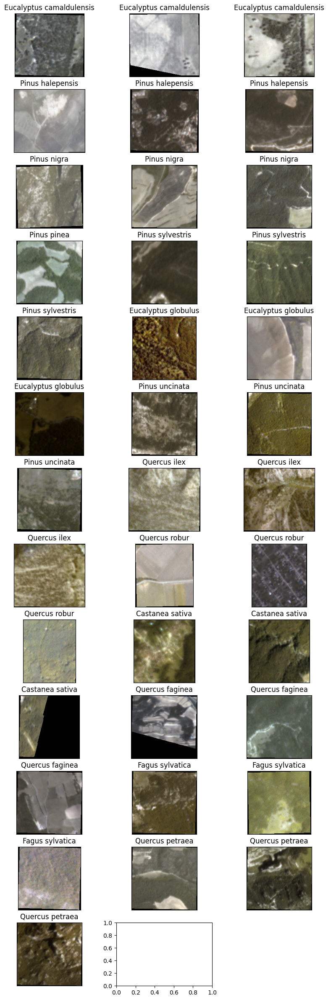

In [82]:
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
plt.rcParams['svg.fonttype'] = 'none'
from remseno import *
fig_dir = f'{data_dir}fig/'
n = 3
fig, axs = plt.subplots(len(set(df['species'].values))-1, n, figsize=(10, 30), facecolor='w', edgecolor='w')

axs = axs.ravel()
axi = 0
for species in set(df['species'].values):
    sub_df = df[df['species'] == species]
    ni = 0
    for img_path in sub_df['path'].values:
        if ni >= n:
            break
        if img_path != None:
            o = Image()
            o.load_image(image_path=img_path)
            o.name = species
            ax = o.plot_nir(axs[axi])
            ax.set_yticks([])
            ax.set_xticks([])
            axi += 1
            ni += 1
plt.axis('off')
plt.gca().axes.get_yaxis().set_visible(False)
plt.gca().axes.get_xaxis().set_visible(False)

plt.savefig(f'{fig_dir}planetscope_data_overview.svg')
plt.show()


In [73]:
df['species'].value_counts()

species
Pinus sylvestris            73
Fagus sylvatica             50
Pinus halepensis            47
Eucalyptus globulus         26
Eucalyptus camaldulensis    23
Quercus ilex                22
Pinus nigra                 10
Quercus robur                5
Quercus faginea              4
Quercus petraea              3
Pinus uncinata               3
Castanea sativa              3
Pinus radiata                1
Pinus pinea                  1
Name: count, dtype: int64

# Plot NDVI filter/mask for each of these

--------------------------------------------------------------------------------
left edge coord:	734901.0	
bottom edge coord:	5882502.0	
right edge coord:	735474.0	
top edge coord:	5883021.0	
dataset width:	191	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32754	
data transform
	| 3.00, 0.00, 734901.00|
| 0.00,-3.00, 5883021.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	339132.0	
bottom edge coord:	5925546.0	
right edge coord:	339702.0	
top edge coord:	5926059.0	
dataset width:	190	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 339132.00|
| 0.00,-3.00, 5926059.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

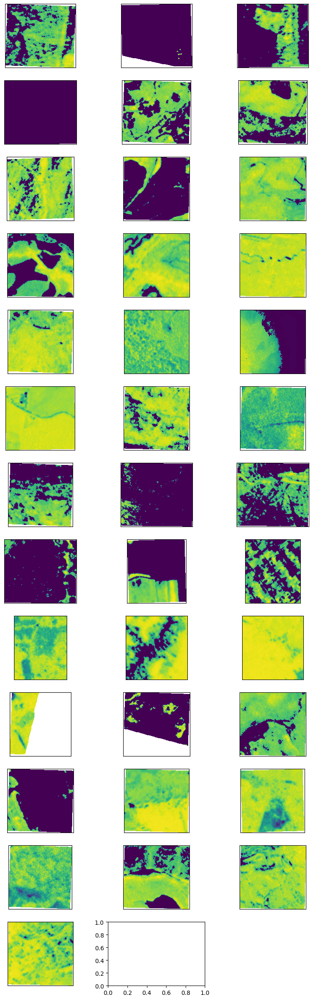

In [84]:
import matplotlib.pyplot as plt
from remseno import *
fig_dir = f'{data_dir}fig/'
n = 3

fig, axs = plt.subplots(len(set(df['species'].values))-1, n, figsize=(10, 30), facecolor='w', edgecolor='w')

axs = axs.ravel()
axi = 0
for species in set(df['species'].values):
    sub_df = df[df['species'] == species]
    ni = 0
    for img_path in sub_df['path'].values:
        if ni >= n:
            break
        if img_path != None:
            o = Image()
            o.load_image(image_path=img_path)
            o.name = species
            ndvi = get_ndvi(image=o.image, red_band=6, nir_band=8)
            mask = o.mask_on_index(ndvi, 0.5)
            axs[axi].imshow(mask*ndvi)
            axs[axi].set_yticks([])
            axs[axi].set_xticks([])
            axi += 1
            ni += 1
plt.axis('off')
plt.gca().axes.get_yaxis().set_visible(False)
plt.gca().axes.get_xaxis().set_visible(False)
plt.savefig(f'{fig_dir}Figure2_planetscope_NDVI_mask.svg')
plt.show()


# have a look at the manually annotated trees

In [86]:
df = pd.read_csv(f'{data_dir}manual/download_DF_dedup_manual_trees.txt', sep='\t')
df = df.dropna(subset=['data_5'])
df

,id,latitude,longitude,tree_id,data_1,data_2,data_3,data_4,data_5,division,...,height_m,crown_radius_m,binary_label,x0,x1,y0,y1,polygon_90m,image_ids,Unnamed: 23
0,52489,46.0200,8.7900,T_496860,"46.018877, 8.791883","46.019303, 8.792329","46.019084, 8.792871","46.018289, 8.792228","46.019766, 8.792395",Angiosperm,...,4.860000,2.700000,0,46.019438,46.020562,8.789595,8.790405,"[(8.789594594594593, 46.020562500000004), (8.7...",20220715_092201_89_2430,NaN
1,52503,46.0900,8.8900,T_497005,"46.089792, 8.889785","46.090280, 8.889065","46.089768, 8.889817","46.089844, 8.890508","46.090099, 8.890372",Angiosperm,...,7.250000,4.250000,0,46.089438,46.090562,8.889595,8.890405,"[(8.889594594594595, 46.090562500000004), (8.8...",20220731_091842_58_2464,NaN
2,52514,46.3800,6.8500,T_496903,"46.379959, 6.849751","46.380322, 6.849487","46.379656, 6.849976","46.379708, 6.850174","46.379843, 6.850512",Angiosperm,...,12.111111,3.888889,0,46.379438,46.380563,6.849595,6.850405,"[(6.849594594594595, 46.3805625), (6.849594594...",20220717_093452_75_2235,NaN
18,59,-34.1700,148.3850,T_390917,"-34.168968, 148.385539","-34.169413, 148.385905","-34.169782, 148.386294","-34.170220, 148.386334","-34.170205, 148.386912",Angiosperm,...,2.200000,NaN,0,-34.170563,-34.169438,148.384595,148.385405,"[(148.38459459459457, -34.1694375), (148.38459...",20221218_230804_14_2459,NaN
22,77,-32.9000,148.5000,T_327763,"-32.896631, 148.500740","-32.899721, 148.495397","-32.900099, 148.495027","-32.898845, 148.503096","-32.902217, 148.497227",Angiosperm,...,4.677778,NaN,0,-32.900562,-32.899437,148.499595,148.500405,"[(148.49959459459458, -32.8994375), (148.49959...",20221225_231035_90_2464,"-32.902045, 148.495835"
23,78,-31.6000,117.7000,T_330648,"-31.600642, 117.700658","-31.600697, 117.700957","-31.600860, 117.701688","-31.601095, 117.700510","-31.600990, 117.702370",Angiosperm,...,5.560000,NaN,0,-31.600562,-31.599438,117.699595,117.700405,"[(117.6995945945946, -31.5994375), (117.699594...",20221230_011616_53_2465,"-31.601308, 117.702947"
26,0,-43.2561,146.9190,T_498824,"-43.256738, 146.918326","-43.256360, 146.919388","-43.256566, 146.920040","-43.257246, 146.920361","-43.256546, 146.921069",Angiosperm,...,82.300000,NaN,0,-43.256662,-43.255538,146.918595,146.919405,"[(146.9185945945946, -43.2555375), (146.918594...",20230113_230929_43_241e,NaN
27,1,-42.9662,146.7574,T_498779,"-42.966351, 146.756606","-42.966956, 146.756019","-42.966277, 146.756639","-42.967042, 146.754272","-42.967331, 146.755398",Angiosperm,...,85.100000,NaN,0,-42.966763,-42.965637,146.756995,146.757805,"[(146.75699459459457, -42.9656375), (146.75699...",20230113_230924_81_241e,NaN
28,4,-42.8000,147.6000,T_332054,"-42.799385, 147.601838","-42.799670, 147.601987","-42.799785, 147.601985","-42.799099, 147.602248","-42.800043, 147.602063",Angiosperm,...,20.500000,NaN,0,-42.800562,-42.799438,147.599595,147.600405,"[(147.59959459459458, -42.799437499999996), (1...",20221226_230459_63_2465,NaN
94,52659,52.8700,13.9000,T_385596,"52.870205, 13.899568","52.870021, 13.899183","52.869676, 13.900177","52.869570, 13.899691","52.869485, 13.900157",Angiosperm,...,19.123729,1.555556,0,52.869437,52.870562,13.899595,13.900405,"[(13.899594594594594, 52.8705625), (13.8995945...",20220627_090602_59_2455,"52.870072, 13.900685"


In [115]:
# Save the coords as a df for each of the rows
t_ids = df['tree_id'].values
data_rows = df[['data_1', 'data_2', 'data_3', 'data_4', 'data_5']].values
for i, s in enumerate(df['species'].values):
    ids, lats, lons, species = [], [], [], []
    for d in data_rows[i]:
        lat_lon = d.strip().split(',')
        lats.append(float(lat_lon[0]))
        lons.append(float(lat_lon[1]))
        ids.append(t_ids[i])
        species.append(s)
    t_df = pd.DataFrame()
    t_df['id'] = ids
    t_df['lat'] = lats
    t_df['lon'] = lons
    t_df['species'] = species
    t_df.to_csv(f'{data_dir}coords/{t_ids[i]}.csv', index=False)

In [116]:
t_df

,id,lat,lon,species
0,T_342238,55.329699,37.000413,Quercus robur
1,T_342238,55.330853,37.000089,Quercus robur
2,T_342238,55.331243,37.000938,Quercus robur
3,T_342238,55.330706,37.001542,Quercus robur
4,T_342238,55.329823,36.997854,Quercus robur


In [96]:
df

,id,latitude,longitude,tree_id,data_1,data_2,data_3,data_4,data_5,division,...,height_m,crown_radius_m,binary_label,x0,x1,y0,y1,polygon_90m,image_ids,Unnamed: 23
0,52489,46.0200,8.7900,T_496860,"46.018877, 8.791883","46.019303, 8.792329","46.019084, 8.792871","46.018289, 8.792228","46.019766, 8.792395",Angiosperm,...,4.860000,2.700000,0,46.019438,46.020562,8.789595,8.790405,"[(8.789594594594593, 46.020562500000004), (8.7...",20220715_092201_89_2430,NaN
1,52503,46.0900,8.8900,T_497005,"46.089792, 8.889785","46.090280, 8.889065","46.089768, 8.889817","46.089844, 8.890508","46.090099, 8.890372",Angiosperm,...,7.250000,4.250000,0,46.089438,46.090562,8.889595,8.890405,"[(8.889594594594595, 46.090562500000004), (8.8...",20220731_091842_58_2464,NaN
2,52514,46.3800,6.8500,T_496903,"46.379959, 6.849751","46.380322, 6.849487","46.379656, 6.849976","46.379708, 6.850174","46.379843, 6.850512",Angiosperm,...,12.111111,3.888889,0,46.379438,46.380563,6.849595,6.850405,"[(6.849594594594595, 46.3805625), (6.849594594...",20220717_093452_75_2235,NaN
18,59,-34.1700,148.3850,T_390917,"-34.168968, 148.385539","-34.169413, 148.385905","-34.169782, 148.386294","-34.170220, 148.386334","-34.170205, 148.386912",Angiosperm,...,2.200000,NaN,0,-34.170563,-34.169438,148.384595,148.385405,"[(148.38459459459457, -34.1694375), (148.38459...",20221218_230804_14_2459,NaN
22,77,-32.9000,148.5000,T_327763,"-32.896631, 148.500740","-32.899721, 148.495397","-32.900099, 148.495027","-32.898845, 148.503096","-32.902217, 148.497227",Angiosperm,...,4.677778,NaN,0,-32.900562,-32.899437,148.499595,148.500405,"[(148.49959459459458, -32.8994375), (148.49959...",20221225_231035_90_2464,"-32.902045, 148.495835"
23,78,-31.6000,117.7000,T_330648,"-31.600642, 117.700658","-31.600697, 117.700957","-31.600860, 117.701688","-31.601095, 117.700510","-31.600990, 117.702370",Angiosperm,...,5.560000,NaN,0,-31.600562,-31.599438,117.699595,117.700405,"[(117.6995945945946, -31.5994375), (117.699594...",20221230_011616_53_2465,"-31.601308, 117.702947"
26,0,-43.2561,146.9190,T_498824,"-43.256738, 146.918326","-43.256360, 146.919388","-43.256566, 146.920040","-43.257246, 146.920361","-43.256546, 146.921069",Angiosperm,...,82.300000,NaN,0,-43.256662,-43.255538,146.918595,146.919405,"[(146.9185945945946, -43.2555375), (146.918594...",20230113_230929_43_241e,NaN
27,1,-42.9662,146.7574,T_498779,"-42.966351, 146.756606","-42.966956, 146.756019","-42.966277, 146.756639","-42.967042, 146.754272","-42.967331, 146.755398",Angiosperm,...,85.100000,NaN,0,-42.966763,-42.965637,146.756995,146.757805,"[(146.75699459459457, -42.9656375), (146.75699...",20230113_230924_81_241e,NaN
28,4,-42.8000,147.6000,T_332054,"-42.799385, 147.601838","-42.799670, 147.601987","-42.799785, 147.601985","-42.799099, 147.602248","-42.800043, 147.602063",Angiosperm,...,20.500000,NaN,0,-42.800562,-42.799438,147.599595,147.600405,"[(147.59959459459458, -42.799437499999996), (1...",20221226_230459_63_2465,NaN
94,52659,52.8700,13.9000,T_385596,"52.870205, 13.899568","52.870021, 13.899183","52.869676, 13.900177","52.869570, 13.899691","52.869485, 13.900157",Angiosperm,...,19.123729,1.555556,0,52.869437,52.870562,13.899595,13.900405,"[(13.899594594594594, 52.8705625), (13.8995945...",20220627_090602_59_2455,"52.870072, 13.900685"


In [117]:
###############################################################################
#                                                                             #
#    This program is free software: you can redistribute it and/or modify     #
#    it under the terms of the GNU General Public License as published by     #
#    the Free Software Foundation, either version 3 of the License, or        #
#    (at your option) any later version.                                      #
#                                                                             #
#    This program is distributed in the hope that it will be useful,          #
#    but WITHOUT ANY WARRANTY; without even the implied warranty of           #
#    MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the            #
#    GNU General Public License for more details.                             #
#                                                                             #
#    You should have received a copy of the GNU General Public License        #
#    along with this program. If not, see <http://www.gnu.org/licenses/>.     #
#                                                                             #
###############################################################################

"""
Here we just want to load the file with the trees in it. This should be in csv format.

User input is required here! You just need to provide information from your file.

Inputs:

1. path to the file with the label
2. x coord column name
3. y cood column name
4. label = the column name with the different labels (expecting a 2 class classifier)
5. name id name for your file
6. separator (i.e. comma, t, or ;)
7. class1 = value of class1 i.e. Sylvatica
8. class2 = value of class2 i.e. Orientalis
"""

from remseno.base import Remsenso
import asyncio
import os

import planet
import matplotlib.pyplot as plt
import pandas as pd
from pyproj import Transformer


os.environ['PL_API_KEY'] = 'PLAK5a21e86c2faf452195d43c3ca3f318ee'


class Coords(Remsenso):

    def __init__(self, file_path: str, x_col: str, y_col: str,
                 label_col: str, id_col: str, class1, class2, crs,
                 binary_label='binary_label', sep=','):
        super().__init__()
        self.df = None
        self.x_col, self.y_col, self.label_col, self.id_col, self.class1, self.class2, \
        self.sep = x_col, y_col, label_col, id_col, class1, class2, sep
        self.binary_label = binary_label
        self.crs = crs # Coordinate reference system
        self.load(file_path)

    def load(self, file_path, plot=False):
        df = pd.read_csv(file_path, sep=self.sep)
        # Filter the dataframe to only include the two classes
        original_size = len(df)
        #df = df[df[self.label_col].isin([self.class1, self.class2])]
        self.u.dp(['Removed rows not in class1 or class2 i.e.', self.class1, self.class2, ' in column:', self.label_col,
                   'Your dataset origionally had:', original_size, '\nNow you have:', len(df)])

        # Make the classes based on the labels provided
        df[self.binary_label] = [0 if c == self.class1 else 1 for c in df[self.label_col].values]
        self.df = df
        if plot:
            # Plot the X and Y coordinates
            plt.scatter(df[self.x_col], df[self.y_col], c=df[self.binary_label].values)
            # Drop the outlier and looks about right woo!
            plt.title('Coords scatter')
            plt.xlabel(self.x_col)
            plt.ylabel(self.y_col)
            plt.show()
            # If you notice that it looks wrong you might need to remove some data or points

    def plot_on_ax(self, ax, image):
        """
        Plot the coords on an orthosomaic
        :param ortho:
        :return:
        """
        ys = self.df[self.y_col].values
        self.df[f'colour'] = ['blue' if c == 0 else 'red' for c in self.df['binary_label'].values]
        colours = self.df[f'colour'].values

        for i, x in enumerate(self.df[self.x_col].values):
            y, x = image.image.index(x, ys[i])
            ax.scatter(x, y, c=colours[i])
            
        return ax

        # If you notice that it looks wrong you might need to remove some data or points
    def plot_on_image(self, image, band=1):
        """
        Plot the coords on an orthosomaic
        :param ortho:
        :return:
        """
        fig, ax = plt.subplots()
        ax = image.plot(band=band, ax=ax, show_plot=False)
        ys = self.df[self.y_col].values
        self.df[f'colour'] = ['blue' if c == 0 else 'red' for c in self.df['binary_label'].values]
        colours = self.df[f'colour'].values

        for i, x in enumerate(self.df[self.x_col].values):
            y, x = image.image.index(x, ys[i])
            ax.scatter(x, y, c=colours[i])
        return ax

    def transform_coord(self, x: float, y: float, src: str, dest: str):
        """
        transform
        :param x:
        :param y:
        :param src:
        :param dest:
        :return:
        """
        transformer = Transformer.from_crs(src, dest)
        return transformer.transform(x, y)  # Double check this on QGIS

    def transform_coords(self, tree_coords: str, image_coords: str, plot=True):
        """
        ## 5. Transform coordinates if necessary

        The geo ref system print out above tells you what the coordinate system is, if that is different to the one
        in your tree file you will need to update these as necessary. I chose to update the coords of the trees.

        You need to know the source and destination coord system
        https://docs.opendronemap.org/arguments/
        For this I use pyproj:
        https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1

        Documentation: https://pyproj4.github.io/pyproj/stable/

        :param tree_coords: e.g. "EPSG:21781"
        :param ortho_coords: e.g. "EPSG:3044" (google maps 4326)
        :param plot
        :return:
        """

        transformer = Transformer.from_crs(tree_coords, image_coords)

        # Now we transform each of the x and y params
        # Convert x and y to the new coord system
        converted_x = []
        converted_y = []
        original_y = self.df[self.y_col].values
        for i, x in enumerate(self.df[self.x_col]):
            x_wsg, y_wsg = transformer.transform(x, original_y[i])  # Double check this on QGIS
            converted_x.append(x_wsg)
            converted_y.append(y_wsg)

        # Save the old coords
        self.df[f'{self.x_col}_{tree_coords}'] = self.df[self.x_col].values
        self.df[f'{self.y_col}_{tree_coords}'] = self.df[self.y_col].values

        # Now add in the new coords
        self.df[self.x_col] = converted_x
        self.df[self.y_col] = converted_y

        if plot:
            # Replot them now
            plt.scatter(self.df[self.x_col], self.df[self.y_col], c=self.df[self.binary_label].values)
            # Drop the outlier and looks about right woo!
            plt.title(f'Coords transformed: {tree_coords} --> {image_coords}')
            plt.xlabel(self.x_col)
            plt.ylabel(self.y_col)
            plt.show()

    def build_circle_from_centre_point(self, x: int, y: int, radius_pixels: int):
        """
        Could be useful for doing something like this:
        https://scipy-lectures.org/advanced/image_processing/auto_examples/plot_radial_mean.html#sphx-glr-advanced-image-processing-auto-examples-plot-radial-mean-py
        :param x: index of picture we want to look at (i.e. pixel x)
        :param y: index of picture we want to look at (i.e. pixel y)
        :param radius_pixels: radius in pixels
        :return:
        """
        circle_xys = []
        r2 = radius_pixels**2  # Radius squared
        xmin = x - radius_pixels
        xmax = x + radius_pixels
        ymin = y - radius_pixels
        ymax = y + radius_pixels
        #ToDo check for size good tech debt
        for xi in range(xmin, xmax):  # Should really check the size but YOLO
            for yi in range(ymin, ymax):
                dx = xi - x
                dy = yi - y
                dists = (dx**2) + (dy**2)
                if dists < r2:
                    circle_xys.append([xi, yi])

        return circle_xys

    def build_polygon_from_centre_point(self, lat: float, lon: float, width_m: float, height_m: float, crs: str):
        """
        Build a polygon shape for using to download planet scope or other satelite data.
        :param lat:
        :param long:
        :param width_m:
        :param height_m:
        :return: polygon/square...
        """
        # First convert to EPSG if not in the right one
        if crs != 'EPSG:4326':
            lat, lon = self.transform_coord(lat, lon, crs, 'EPSG:4326')
        # Get the width and offset each of the points
        w = width_m/2
        h = height_m/2
        poly = [self.offset(lat, lon, -1 * w, h),  # LH corner
                self.offset(lat, lon, -1 * w, -1 * h),  # UP
                self.offset(lat, lon, w, -1 * h),  # Right
                self.offset(lat, lon, w, h),  # Right corner
                self.offset(lat, lon, -1 * w, h)]  # Start again
        # Convert back
        if crs != 'EPSG:4326':
            # Project the feature to the desired CRS
            poly = [self.transform_coord(b[0], b[1], 'EPSG:4326', crs) for b in poly]
        return poly

    def offset_latitude(self, lat: float, distance_x_m: float):
        """
        Offset latitude.
        :param lat:
        :param distance_x_m:
        :return:
        """

        # Earth’s radius, sphere
        R = 6378137

        # Coordinate offsets in radians
        dLat = distance_x_m/111000 # distance_x_m / R
        return lat + dLat #* 180 / np.pi

    def offset_longditude(self, lon: float, distance_y_m: float):
        """
        Offset longditude.

        Thank you Hugo Palmer m8y
        https://gis.stackexchange.com/questions/289111/how-to-add-meters-to-epsg4326-coordinates
        :param lon:
        :param distance_y_m:
        :return:
        """
        # Earth’s radius, sphere
        R = 6378137

        # Coordinate offsets in radians
        dLon = distance_y_m / 80000  # (R * np.cos(np.pi * lon / 180))

        # OffsetPosition, decimal degrees
        return lon + dLon #* 180 / np.pi

    def offset(self, lat: float, lon: float, distance_x_m: float, distance_y_m: float):
        """
        Offset a coord file (x, y) by certain number of m's

        Thanks so ol m8 haakon_d from stack overflow:
        https://gis.stackexchange.com/questions/2951/algorithm-for-offsetting-a-latitude-longitude-by-some-amount-of-meters

        :param distance_x_m: distance to offset in m
        :param distance_y_m: distance to offset in m
        :param lon: longditude
        :param lat: latitude
        :return:
        """
        # Earth’s radius, sphere
        return self.offset_latitude(lat, distance_x_m), self.offset_longditude(lon, distance_y_m)



--------------------------------------------------------------------------------
left edge coord:	483501.0	
bottom edge coord:	5096040.0	
right edge coord:	483990.0	
top edge coord:	5096544.0	
dataset width:	163	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32632	
data transform
	| 3.00, 0.00, 483501.00|
| 0.00,-3.00, 5096544.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_496860 ../data/tallo/planetscope/sat_data/205329a8-65d5-493a-b55f-1b905b217aaa/PSScene/20220715_092201_89_2430_3B_AnalyticMS_SR_8b_clip.tif Castanea sativa
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


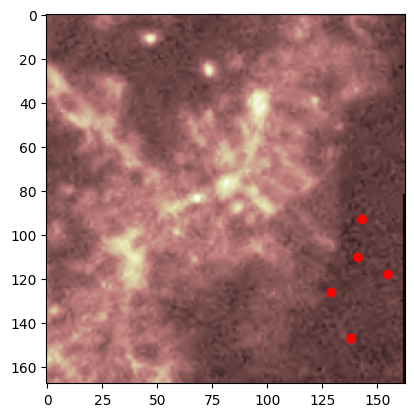

--------------------------------------------------------------------------------
left edge coord:	491253.0	
bottom edge coord:	5103801.0	
right edge coord:	491739.0	
top edge coord:	5104305.0	
dataset width:	162	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32632	
data transform
	| 3.00, 0.00, 491253.00|
| 0.00,-3.00, 5104305.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_497005 ../data/tallo/planetscope/sat_data/97ad3efd-0200-4313-917f-7b1c65243d93/PSScene/20220731_091842_58_2464_3B_AnalyticMS_SR_8b_clip.tif Castanea sativa
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


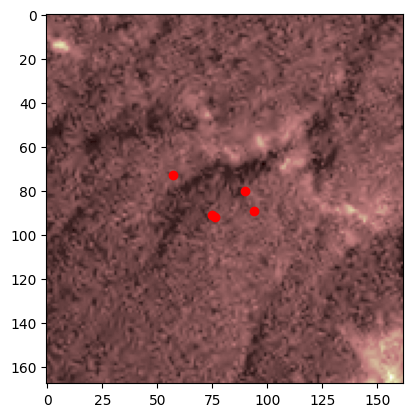

--------------------------------------------------------------------------------
left edge coord:	334416.0	
bottom edge coord:	5138256.0	
right edge coord:	334914.0	
top edge coord:	5138775.0	
dataset width:	166	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32632	
data transform
	| 3.00, 0.00, 334416.00|
| 0.00,-3.00, 5138775.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_496903 ../data/tallo/planetscope/sat_data/7887de72-9abc-4471-95ee-29c7ad7ab3ed/PSScene/20220717_093452_75_2235_3B_AnalyticMS_SR_8b_clip.tif Castanea sativa
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


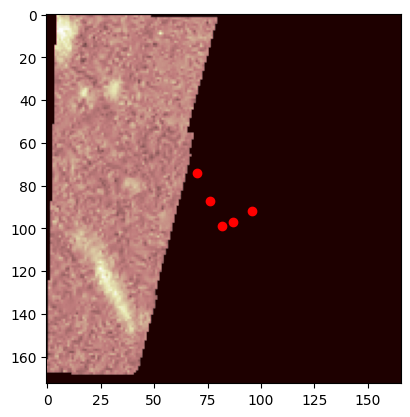

--------------------------------------------------------------------------------
left edge coord:	627357.0	
bottom edge coord:	6217872.0	
right edge coord:	627945.0	
top edge coord:	6218382.0	
dataset width:	196	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 627357.00|
| 0.00,-3.00, 6218382.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_390917 ../data/tallo/planetscope/sat_data/56ab7622-ea90-46cc-8858-630fd28d432b/PSScene/20221218_230804_14_2459_3B_AnalyticMS_SR_8b_clip.tif Eucalyptus camaldulensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


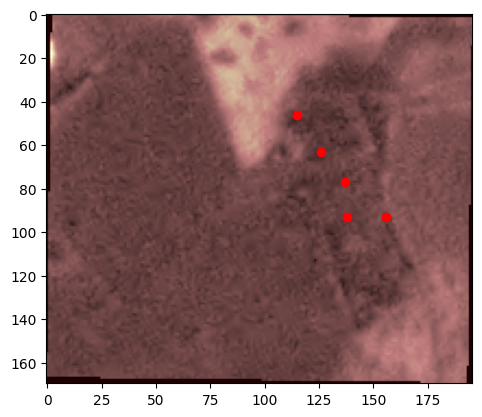

--------------------------------------------------------------------------------
left edge coord:	639990.0	
bottom edge coord:	6358545.0	
right edge coord:	640587.0	
top edge coord:	6359058.0	
dataset width:	199	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 639990.00|
| 0.00,-3.00, 6359058.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_327763 ../data/tallo/planetscope/sat_data/af03ac5c-67de-4c74-aa2f-04744d09110c/PSScene/20221225_231035_90_2464_3B_AnalyticMS_SR_8b_clip.tif Eucalyptus camaldulensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


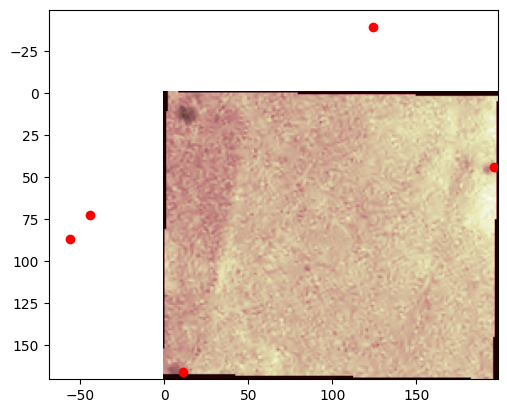

--------------------------------------------------------------------------------
left edge coord:	566106.0	
bottom edge coord:	6503433.0	
right edge coord:	566703.0	
top edge coord:	6503940.0	
dataset width:	199	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32750	
data transform
	| 3.00, 0.00, 566106.00|
| 0.00,-3.00, 6503940.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_330648 ../data/tallo/planetscope/sat_data/69f52d46-951a-4b99-991a-a8c862eef0c1/PSScene/20221230_011616_53_2465_3B_AnalyticMS_SR_8b_clip.tif Eucalyptus camaldulensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


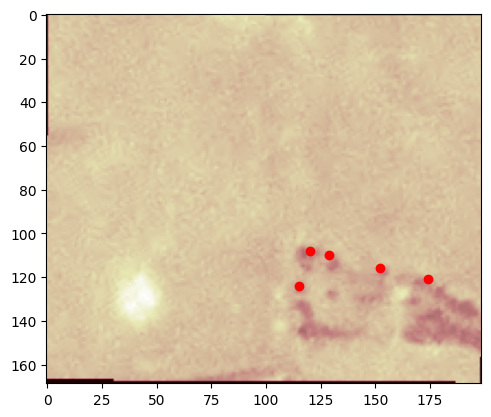

--------------------------------------------------------------------------------
left edge coord:	479958.0	
bottom edge coord:	5242659.0	
right edge coord:	480471.0	
top edge coord:	5243163.0	
dataset width:	171	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 479958.00|
| 0.00,-3.00, 5243163.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_498779 ../data/tallo/planetscope/sat_data/dab9fa59-4a98-4319-ad5f-acea23bc6feb/PSScene/20230113_230924_81_241e_3B_AnalyticMS_SR_8b_clip.tif Eucalyptus globulus
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


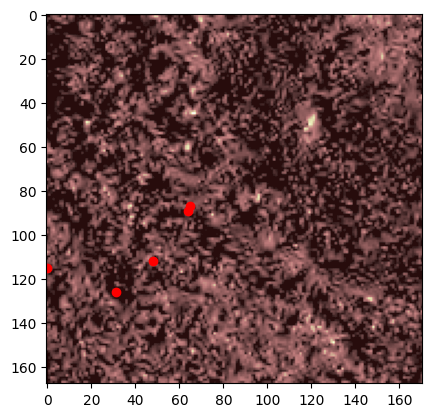

--------------------------------------------------------------------------------
left edge coord:	548805.0	
bottom edge coord:	5260968.0	
right edge coord:	549321.0	
top edge coord:	5261472.0	
dataset width:	172	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 548805.00|
| 0.00,-3.00, 5261472.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_332054 ../data/tallo/planetscope/sat_data/7ff0b6f0-ac10-4441-9f31-5eaff752f8c7/PSScene/20221226_230459_63_2465_3B_AnalyticMS_SR_8b_clip.tif Eucalyptus globulus
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


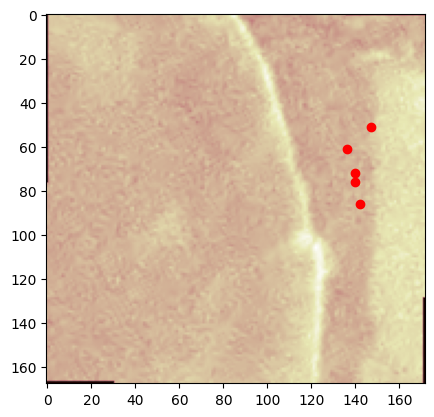

--------------------------------------------------------------------------------
left edge coord:	425742.0	
bottom edge coord:	5858121.0	
right edge coord:	426174.0	
top edge coord:	5858631.0	
dataset width:	144	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 425742.00|
| 0.00,-3.00, 5858631.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_385596 ../data/tallo/planetscope/sat_data/112da36e-77ea-4bc4-ba68-d47cb1496f1f/PSScene/20220627_090602_59_2455_3B_AnalyticMS_SR_8b_clip.tif Fagus sylvatica
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


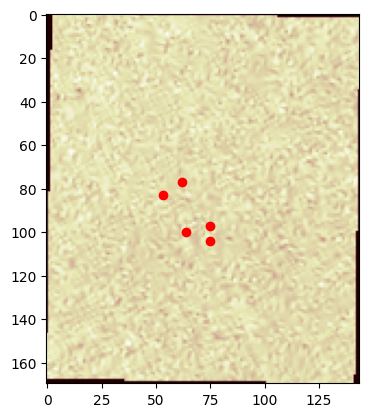

--------------------------------------------------------------------------------
left edge coord:	589614.0	
bottom edge coord:	6104343.0	
right edge coord:	590028.0	
top edge coord:	6104853.0	
dataset width:	138	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32634	
data transform
	| 3.00, 0.00, 589614.00|
| 0.00,-3.00, 6104853.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_116468 ../data/tallo/planetscope/sat_data/e9954051-7d61-41b5-915d-a2e55fd10f05/PSScene/20220722_083509_20_2428_3B_AnalyticMS_SR_8b_clip.tif Fagus sylvatica
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


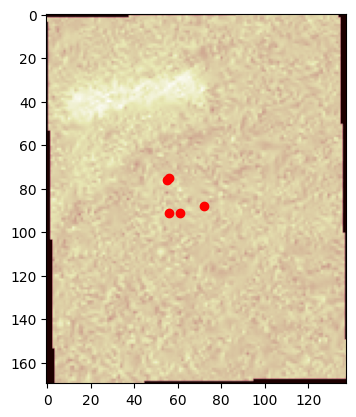

--------------------------------------------------------------------------------
left edge coord:	449280.0	
bottom edge coord:	6173730.0	
right edge coord:	449682.0	
top edge coord:	6174240.0	
dataset width:	134	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 449280.00|
| 0.00,-3.00, 6174240.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_114569 ../data/tallo/planetscope/sat_data/8cc1cb2e-dd54-44c1-8621-0b3068d653e9/PSScene/20230514_090811_35_2449_3B_AnalyticMS_SR_8b_clip.tif Fagus sylvatica
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


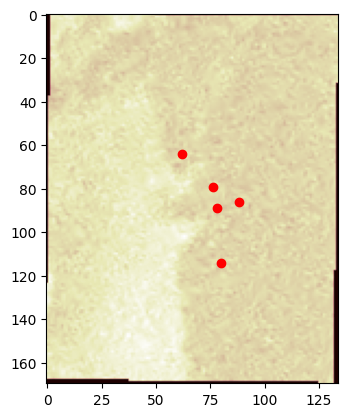

--------------------------------------------------------------------------------
left edge coord:	606780.0	
bottom edge coord:	4427700.0	
right edge coord:	607323.0	
top edge coord:	4428210.0	
dataset width:	181	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 606780.00|
| 0.00,-3.00, 4428210.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_271641 ../data/tallo/planetscope/sat_data/ac309268-208c-46bd-8eda-749131854abf/PSScene/20220621_093201_88_2435_3B_AnalyticMS_SR_8b_clip.tif Pinus halepensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


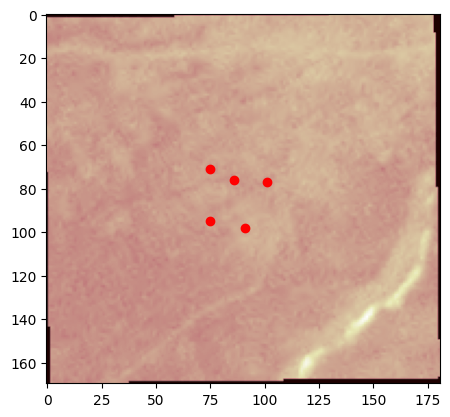

--------------------------------------------------------------------------------
left edge coord:	321762.0	
bottom edge coord:	4581759.0	
right edge coord:	322299.0	
top edge coord:	4582275.0	
dataset width:	179	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 321762.00|
| 0.00,-3.00, 4582275.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_229086 ../data/tallo/planetscope/sat_data/ea05bbfc-4079-4651-bad1-17d30326cef7/PSScene/20220713_094524_71_2460_3B_AnalyticMS_SR_8b_clip.tif Pinus halepensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


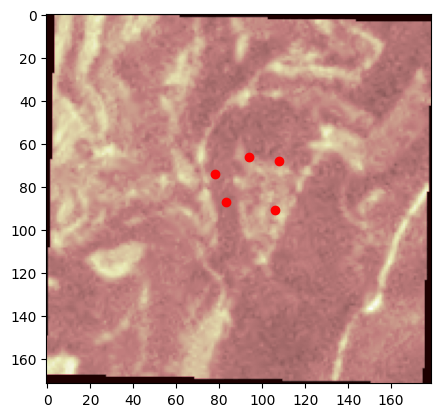

--------------------------------------------------------------------------------
left edge coord:	343728.0	
bottom edge coord:	4644792.0	
right edge coord:	344259.0	
top edge coord:	4645308.0	
dataset width:	177	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 343728.00|
| 0.00,-3.00, 4645308.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_246928 ../data/tallo/planetscope/sat_data/0e9a833a-7dc4-4a35-a03b-2cca65004d70/PSScene/20220713_094515_54_2460_3B_AnalyticMS_SR_8b_clip.tif Pinus halepensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


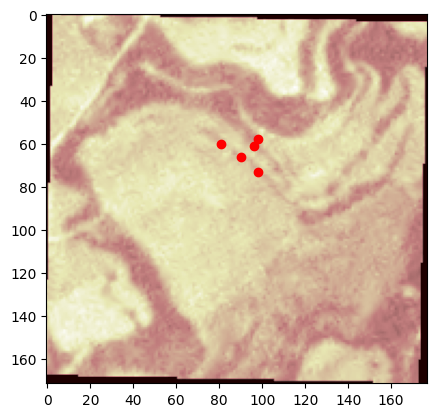

--------------------------------------------------------------------------------
left edge coord:	357780.0	
bottom edge coord:	4646718.0	
right edge coord:	358311.0	
top edge coord:	4647234.0	
dataset width:	177	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 357780.00|
| 0.00,-3.00, 4647234.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_248769 ../data/tallo/planetscope/sat_data/c0ecd39d-b121-4237-93e3-4c5d604e9e52/PSScene/20220615_094548_18_2428_3B_AnalyticMS_SR_8b_clip.tif Pinus nigra
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


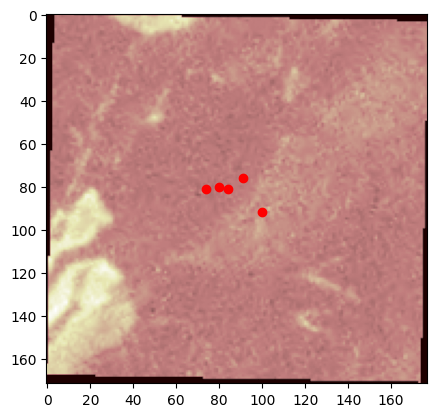

--------------------------------------------------------------------------------
left edge coord:	760440.0	
bottom edge coord:	4672659.0	
right edge coord:	760977.0	
top edge coord:	4673181.0	
dataset width:	179	
dataset height:	174	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32630	
data transform
	| 3.00, 0.00, 760440.00|
| 0.00,-3.00, 4673181.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_229579 ../data/tallo/planetscope/sat_data/2b8adeca-ee79-4ffd-ba0a-fdefc2c02e90/PSScene/20220726_094935_19_2463_3B_AnalyticMS_SR_8b_clip.tif Pinus nigra
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


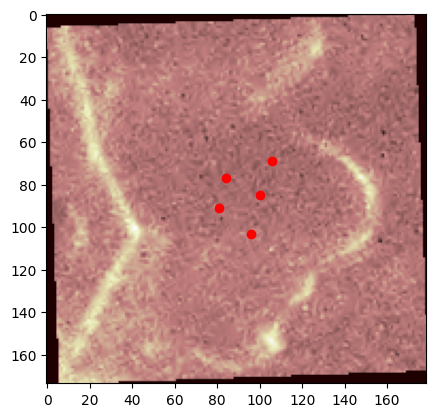

--------------------------------------------------------------------------------
left edge coord:	469008.0	
bottom edge coord:	5138316.0	
right edge coord:	469494.0	
top edge coord:	5138823.0	
dataset width:	162	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32636	
data transform
	| 3.00, 0.00, 469008.00|
| 0.00,-3.00, 5138823.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_342146 ../data/tallo/planetscope/sat_data/f1d22bfa-873b-4e43-9a4b-e885cbfb94e7/PSScene/20220619_074626_82_2430_3B_AnalyticMS_SR_8b_clip.tif Pinus nigra
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


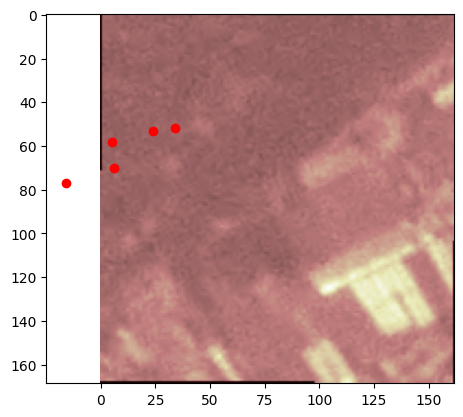

--------------------------------------------------------------------------------
left edge coord:	406755.0	
bottom edge coord:	4626699.0	
right edge coord:	407286.0	
top edge coord:	4627209.0	
dataset width:	177	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 406755.00|
| 0.00,-3.00, 4627209.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_251805 ../data/tallo/planetscope/sat_data/8463c192-e4f8-4632-8a55-e46a44adc5d9/PSScene/20220803_094107_38_2451_3B_AnalyticMS_SR_8b_clip.tif Pinus pinea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


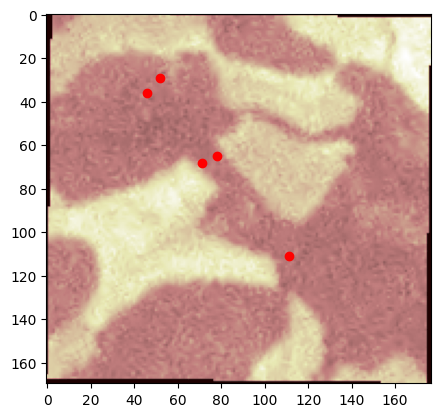

--------------------------------------------------------------------------------
left edge coord:	690474.0	
bottom edge coord:	5539317.0	
right edge coord:	690945.0	
top edge coord:	5539836.0	
dataset width:	157	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32634	
data transform
	| 3.00, 0.00, 690474.00|
| 0.00,-3.00, 5539836.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_119451 ../data/tallo/planetscope/sat_data/b5165857-908a-4637-a99e-c1cdfac1a34d/PSScene/20230506_082424_05_2430_3B_AnalyticMS_SR_8b_clip.tif Pinus sylvestris
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


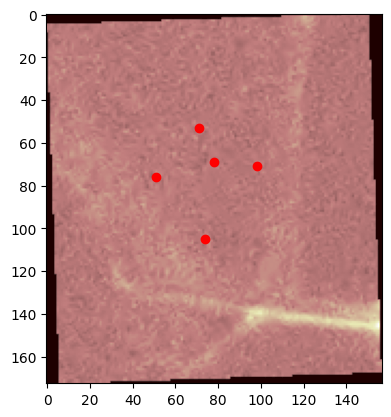

--------------------------------------------------------------------------------
left edge coord:	406032.0	
bottom edge coord:	5770341.0	
right edge coord:	406473.0	
top edge coord:	5770854.0	
dataset width:	147	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 406032.00|
| 0.00,-3.00, 5770854.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_113959 ../data/tallo/planetscope/sat_data/a0ee8aec-7b8a-4b59-a785-65be076c9c9d/PSScene/20220627_090613_94_2455_3B_AnalyticMS_SR_8b_clip.tif Pinus sylvestris
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


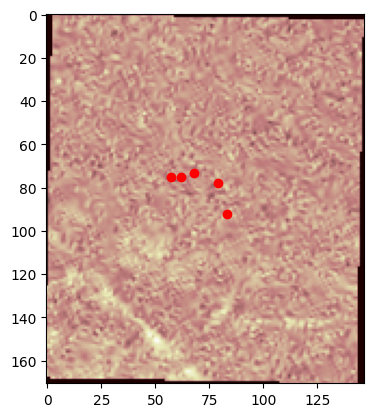

--------------------------------------------------------------------------------
left edge coord:	405045.0	
bottom edge coord:	6151200.0	
right edge coord:	405453.0	
top edge coord:	6151713.0	
dataset width:	136	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32643	
data transform
	| 3.00, 0.00, 405045.00|
| 0.00,-3.00, 6151713.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_343226 ../data/tallo/planetscope/sat_data/3c362d70-b916-450a-967f-02212d8f74c9/PSScene/20230611_051422_39_241f_3B_AnalyticMS_SR_8b_clip.tif Pinus sylvestris
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


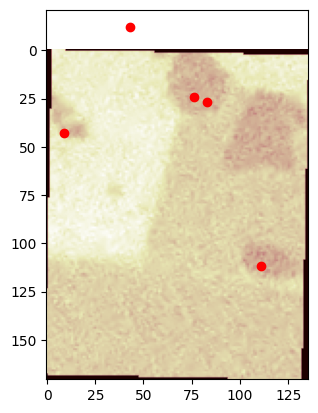

--------------------------------------------------------------------------------
left edge coord:	400761.0	
bottom edge coord:	4613787.0	
right edge coord:	401289.0	
top edge coord:	4614297.0	
dataset width:	176	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 400761.00|
| 0.00,-3.00, 4614297.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_240435 ../data/tallo/planetscope/sat_data/c08159e0-bf34-4ba5-a305-d090b57f3cfc/PSScene/20220611_094231_01_2463_3B_AnalyticMS_SR_8b_clip.tif Quercus faginea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


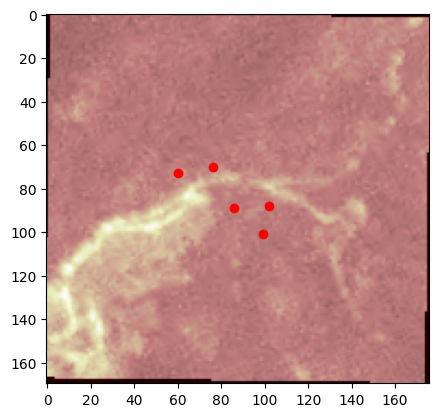

--------------------------------------------------------------------------------
left edge coord:	333759.0	
bottom edge coord:	4689792.0	
right edge coord:	334290.0	
top edge coord:	4690305.0	
dataset width:	177	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 333759.00|
| 0.00,-3.00, 4690305.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_213843 ../data/tallo/planetscope/sat_data/7681af08-2ba8-4fbd-87df-a57631ff8c39/PSScene/20220713_094510_95_2460_3B_AnalyticMS_SR_8b_clip.tif Quercus faginea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


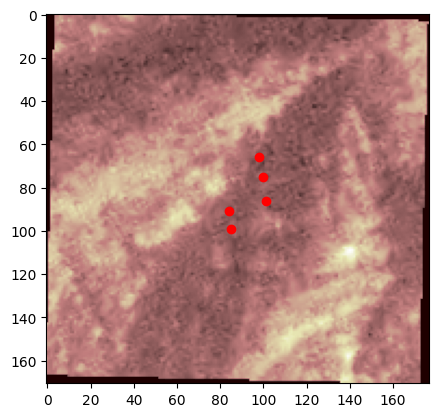

--------------------------------------------------------------------------------
left edge coord:	415257.0	
bottom edge coord:	3907341.0	
right edge coord:	415833.0	
top edge coord:	3907851.0	
dataset width:	192	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32643	
data transform
	| 3.00, 0.00, 415257.00|
| 0.00,-3.00, 3907851.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_171799 ../data/tallo/planetscope/sat_data/fba3f974-2351-49f5-af38-c2fff637a446/PSScene/20230622_045440_85_24cf_3B_AnalyticMS_SR_8b_clip.tif Quercus ilex
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


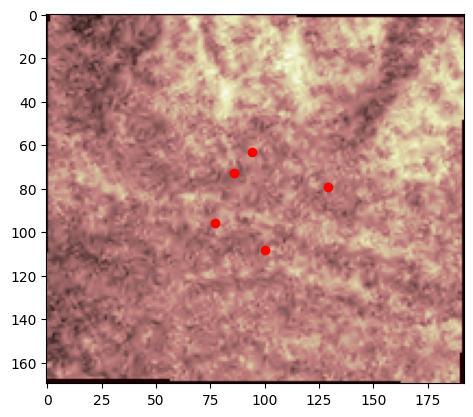

--------------------------------------------------------------------------------
left edge coord:	407373.0	
bottom edge coord:	3944910.0	
right edge coord:	407946.0	
top edge coord:	3945420.0	
dataset width:	191	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32643	
data transform
	| 3.00, 0.00, 407373.00|
| 0.00,-3.00, 3945420.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_167649 ../data/tallo/planetscope/sat_data/24a8ff65-f5da-466c-b310-8aa075b9bfa7/PSScene/20230620_043335_33_2445_3B_AnalyticMS_SR_8b_clip.tif Quercus ilex
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


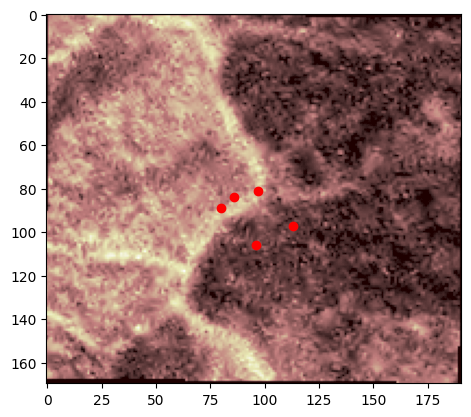

--------------------------------------------------------------------------------
left edge coord:	272778.0	
bottom edge coord:	4662708.0	
right edge coord:	273315.0	
top edge coord:	4663230.0	
dataset width:	179	
dataset height:	174	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 272778.00|
| 0.00,-3.00, 4663230.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_234225 ../data/tallo/planetscope/sat_data/eb682f0f-3ac9-4cf5-b760-25a86e0dbce6/PSScene/20220711_095053_55_2465_3B_AnalyticMS_SR_8b_clip.tif Quercus ilex
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


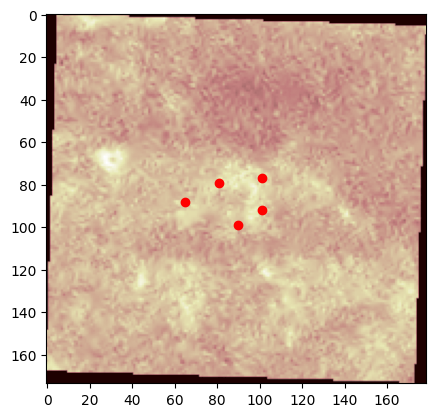

--------------------------------------------------------------------------------
left edge coord:	354759.0	
bottom edge coord:	4599795.0	
right edge coord:	355293.0	
top edge coord:	4600308.0	
dataset width:	178	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 354759.00|
| 0.00,-3.00, 4600308.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_222333 ../data/tallo/planetscope/sat_data/de00878c-6f22-4d29-9ce4-fb4cd0d3e3c5/PSScene/20220615_094555_59_2428_3B_AnalyticMS_SR_8b_clip.tif Quercus petraea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


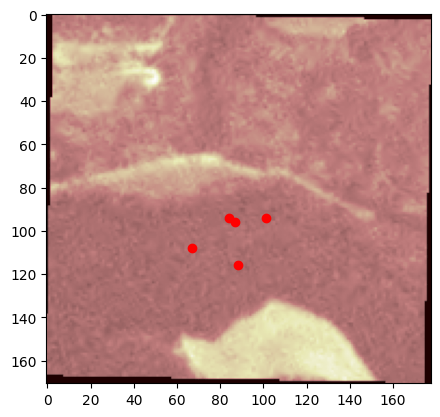

--------------------------------------------------------------------------------
left edge coord:	384783.0	
bottom edge coord:	4670778.0	
right edge coord:	385311.0	
top edge coord:	4671288.0	
dataset width:	176	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 384783.00|
| 0.00,-3.00, 4671288.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_287351 ../data/tallo/planetscope/sat_data/e78d52e2-8f1d-4f0a-9e62-44b622af5e8c/PSScene/20230625_094229_51_2451_3B_AnalyticMS_SR_8b_clip.tif Quercus petraea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


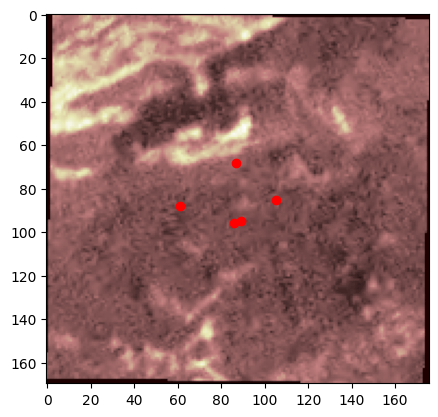

--------------------------------------------------------------------------------
left edge coord:	405774.0	
bottom edge coord:	4683792.0	
right edge coord:	406299.0	
top edge coord:	4684302.0	
dataset width:	175	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 405774.00|
| 0.00,-3.00, 4684302.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_267784 ../data/tallo/planetscope/sat_data/fe1db68e-ff6b-482f-9bcf-f1a671a64948/PSScene/20230625_094227_36_2451_3B_AnalyticMS_SR_8b_clip.tif Quercus petraea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


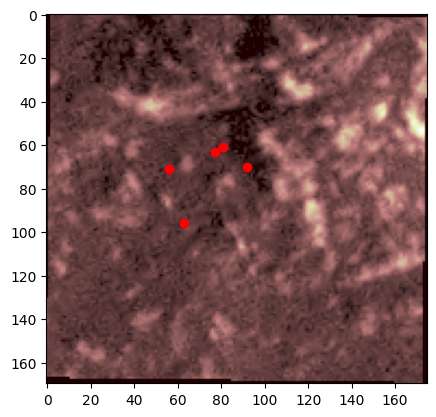

--------------------------------------------------------------------------------
left edge coord:	473487.0	
bottom edge coord:	5909358.0	
right edge coord:	473907.0	
top edge coord:	5909865.0	
dataset width:	140	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 473487.00|
| 0.00,-3.00, 5909865.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_114789 ../data/tallo/planetscope/sat_data/9eafc70a-34f1-4016-9fb4-8aebce16e528/PSScene/20230609_090751_75_241e_3B_AnalyticMS_SR_8b_clip.tif Quercus robur
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


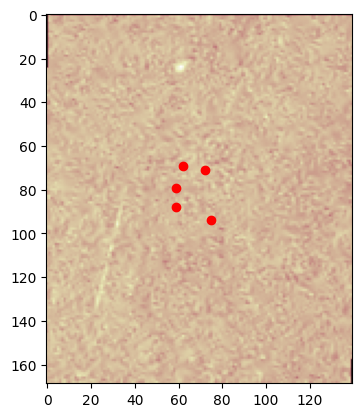

--------------------------------------------------------------------------------
left edge coord:	372918.0	
bottom edge coord:	6133077.0	
right edge coord:	373332.0	
top edge coord:	6133593.0	
dataset width:	138	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32637	
data transform
	| 3.00, 0.00, 372918.00|
| 0.00,-3.00, 6133593.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_342238 ../data/tallo/planetscope/sat_data/7b7c4988-54c9-4086-9a3d-dba5c3b45dfd/PSScene/20220624_074058_26_2421_3B_AnalyticMS_SR_8b_clip.tif Quercus robur
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


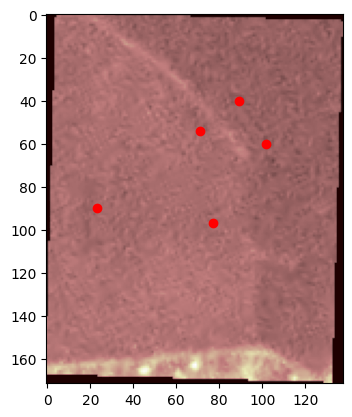

In [129]:
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt

plt.rcParams['svg.fonttype'] = 'none'
t_ids = df['tree_id'].values
fig_dir = f'{data_dir}fig/'
n = 3
# fig, axs = plt.subplots(len(set(df['species'].values))-1, n, figsize=(10, 30), facecolor='w', edgecolor='w')

# axs = axs.ravel()
# axi = 0

for i, img_path in enumerate(df['path'].values):
    if img_path != None:
        o = Image()
        o.load_image(image_path=img_path)
        print(t_ids[i], img_path, df['species'].values[i])
        c = Coords(f'{data_dir}coords/{t_ids[i]}.csv', x_col='lat', y_col='lon', label_col='id',
               id_col='tree_id', sep=',', class1=s, class2=s, crs="EPSG:4326")
        c.transform_coords(tree_coords="EPSG:4326", image_coords=str(o.image.crs), plot=False)
        c.plot_on_image(o)
        plt.show()
#             ax = o.plot_nir(axs[axi])
#             c.plot_on_ax(ax, o)
#             ax.set_yticks([])
#             ax.set_xticks([])
        axi += 1
# plt.axis('off')
# plt.gca().axes.get_yaxis().set_visible(False)
# plt.gca().axes.get_xaxis().set_visible(False)

# plt.savefig(f'{fig_dir}Figure2_planetscope_annotation.svg')
# plt.show()


--------------------------------------------------------------------------------
left edge coord:	483501.0	
bottom edge coord:	5096040.0	
right edge coord:	483990.0	
top edge coord:	5096544.0	
dataset width:	163	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32632	
data transform
	| 3.00, 0.00, 483501.00|
| 0.00,-3.00, 5096544.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_496860 ../data/tallo/planetscope/sat_data/205329a8-65d5-493a-b55f-1b905b217aaa/PSScene/20220715_092201_89_2430_3B_AnalyticMS_SR_8b_clip.tif Castanea sativa
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------
-----------------------------------------------------------------------

--------------------------------------------------------------------------------
left edge coord:	589614.0	
bottom edge coord:	6104343.0	
right edge coord:	590028.0	
top edge coord:	6104853.0	
dataset width:	138	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32634	
data transform
	| 3.00, 0.00, 589614.00|
| 0.00,-3.00, 6104853.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_116468 ../data/tallo/planetscope/sat_data/e9954051-7d61-41b5-915d-a2e55fd10f05/PSScene/20220722_083509_20_2428_3B_AnalyticMS_SR_8b_clip.tif Fagus sylvatica
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------
-----------------------------------------------------------------------

--------------------------------------------------------------------------------
left edge coord:	690474.0	
bottom edge coord:	5539317.0	
right edge coord:	690945.0	
top edge coord:	5539836.0	
dataset width:	157	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32634	
data transform
	| 3.00, 0.00, 690474.00|
| 0.00,-3.00, 5539836.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_119451 ../data/tallo/planetscope/sat_data/b5165857-908a-4637-a99e-c1cdfac1a34d/PSScene/20230506_082424_05_2430_3B_AnalyticMS_SR_8b_clip.tif Pinus sylvestris
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------
----------------------------------------------------------------------

--------------------------------------------------------------------------------
left edge coord:	405774.0	
bottom edge coord:	4683792.0	
right edge coord:	406299.0	
top edge coord:	4684302.0	
dataset width:	175	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 405774.00|
| 0.00,-3.00, 4684302.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_267784 ../data/tallo/planetscope/sat_data/fe1db68e-ff6b-482f-9bcf-f1a671a64948/PSScene/20230625_094227_36_2451_3B_AnalyticMS_SR_8b_clip.tif Quercus petraea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------
-----------------------------------------------------------------------

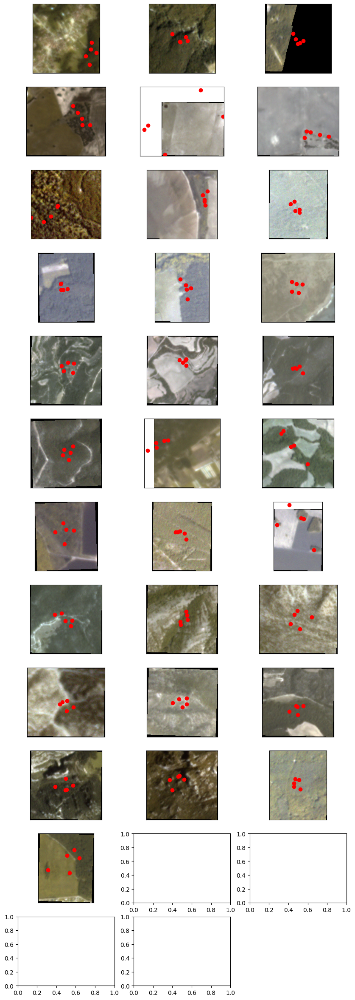

In [130]:
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt

plt.rcParams['svg.fonttype'] = 'none'
t_ids = df['tree_id'].values
fig_dir = f'{data_dir}fig/'
n = 3
fig, axs = plt.subplots(len(set(df['species'].values))-1, n, figsize=(10, 30), facecolor='w', edgecolor='w')

axs = axs.ravel()
axi = 0

for i, img_path in enumerate(df['path'].values):
    if img_path != None:
        o = Image()
        o.load_image(image_path=img_path)
        print(t_ids[i], img_path, df['species'].values[i])
        c = Coords(f'{data_dir}coords/{t_ids[i]}.csv', x_col='lat', y_col='lon', label_col='id',
               id_col='tree_id', sep=',', class1=s, class2=s, crs="EPSG:4326")
        c.transform_coords(tree_coords="EPSG:4326", image_coords=str(o.image.crs), plot=False)
        ax = o.plot_nir(axs[axi])
        c.plot_on_ax(ax, o)
        ax.set_yticks([])
        ax.set_xticks([])
        axi += 1
plt.axis('off')
plt.gca().axes.get_yaxis().set_visible(False)
plt.gca().axes.get_xaxis().set_visible(False)

plt.savefig(f'{fig_dir}Figure2_planetscope_annotation.svg')
plt.show()


In [144]:
df

,id,lat,lon,species
0,T_496860,46.018877,8.791883,Castanea sativa
1,T_496860,46.019303,8.792329,Castanea sativa
2,T_496860,46.019084,8.792871,Castanea sativa
3,T_496860,46.018289,8.792228,Castanea sativa
4,T_496860,46.019766,8.792395,Castanea sativa


--------------------------------------------------------------------------------
left edge coord:	372918.0	
bottom edge coord:	6133077.0	
right edge coord:	373332.0	
top edge coord:	6133593.0	
dataset width:	138	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32637	
data transform
	| 3.00, 0.00, 372918.00|
| 0.00,-3.00, 6133593.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


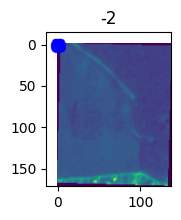

In [150]:
plt.figure(figsize=(20, 2))
n = 2
o = Image()
o.load_image(image_path=img_path)
c = Coords(f'{data_dir}coords/{t_ids[i]}.csv', x_col='lat', y_col='lon', label_col='id',
       id_col='tree_id', sep=',', class1=s, class2=s, crs="EPSG:4326")
c.transform_coords(tree_coords="EPSG:4326", image_coords=str(o.image.crs), plot=False)

df = pd.read_csv(f'{data_dir}coords/{t_ids[i]}.csv')
x = df[c.x_col].values[0]
y = df[c.y_col].values[0]
bb0 = c.build_polygon_from_centre_point(x, y, 1, 1, str(o.image.crs))
bb = [o.image.index(x[0], x[1]) for x in bb0]
plt.imshow(o.image.read(2))
x = df[c.x_col].values[0]
y = df[c.y_col].values[0]
y, x = o.image.index(x, y)
bb = c.build_circle_from_centre_point(x, y, 8)
for b in bb:
    plt.scatter(b[0]-x0, b[1]-y0, s=2, c='blue', alpha=0.5)
plt.title(f'{len(df) - offset - axi}')
axi += 1

In [ ]:
# Test the classification acc on these points but need to first update so that trees can be individa

--------------------------------------------------------------------------------
left edge coord:	372918.0	
bottom edge coord:	6133077.0	
right edge coord:	373332.0	
top edge coord:	6133593.0	
dataset width:	138	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32637	
data transform
	| 3.00, 0.00, 372918.00|
| 0.00,-3.00, 6133593.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_342238 ../data/tallo/planetscope/sat_data/7b7c4988-54c9-4086-9a3d-dba5c3b45dfd/PSScene/20220624_074058_26_2421_3B_AnalyticMS_SR_8b_clip.tif Quercus robur
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


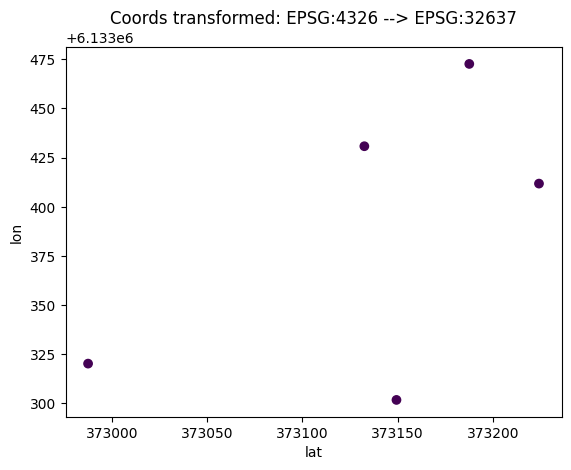

<Axes: >

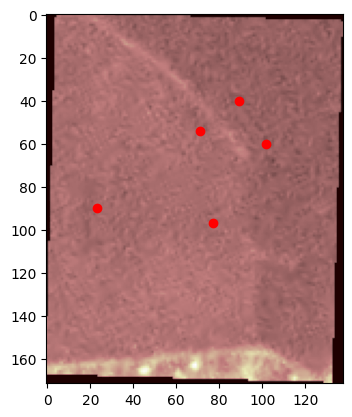

In [128]:
o = Image()
o.load_image(image_path=img_path)
print(t_ids[i], img_path, df['species'].values[i])
c = Coords(f'{data_dir}coords/{t_ids[i]}.csv', x_col='lat', y_col='lon', label_col='id',
       id_col='tree_id', sep=',', class1=s, class2=s, crs="EPSG:4326")
c.transform_coords(tree_coords="EPSG:4326", image_coords=str(o.image.crs), plot=True)
c.plot_on_image(o)

In [111]:
print(o.image.crs)

EPSG:32755


--------------------------------------------------------------------------------
left edge coord:	479958.0	
bottom edge coord:	5242659.0	
right edge coord:	480471.0	
top edge coord:	5243163.0	
dataset width:	171	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 479958.00|
| 0.00,-3.00, 5243163.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	548805.0	
bottom edge coord:	5260968.0	
right edge coord:	549321.0	
top edge coord:	5261472.0	
dataset width:	172	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 548805.00|
| 0.00,-3.00, 5261472.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:60: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)


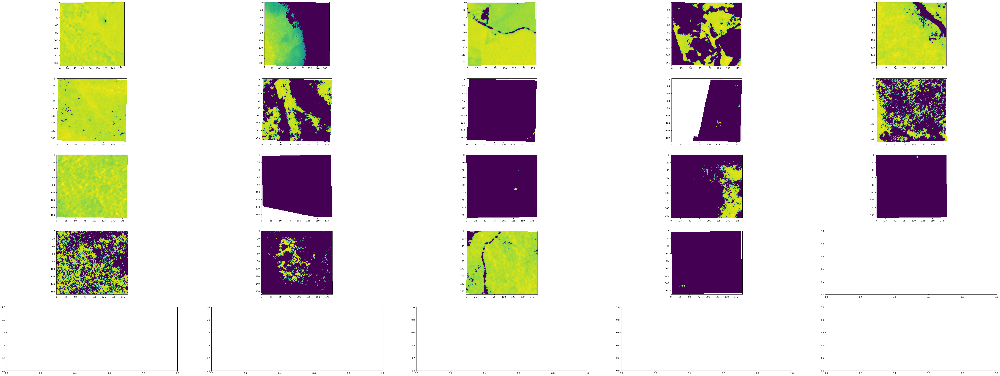

In [74]:
from remseno.indices import *
sub_df = df.head(20)
n = 5
fig, axs = plt.subplots(n,n, figsize=(80, 30), facecolor='w', edgecolor='w')

labels = sub_df['species'].values
axs = axs.ravel()
axi = 0
for img_path in sub_df['path'].values:
    if img_path != None:
        try:
            o = Image()
            o.load_image(image_path=img_path)
            o.name=labels[axi]
            ndvi = get_ndvi(image=o.image, red_band=6, nir_band=8)
            mask = o.mask_on_index(ndvi, 0.75)
            axs[axi].imshow(mask*ndvi)
            axi += 1
        except:
            break
plt.savefig(f'{fig_dir}Figure2_planetscope_NDVI_mask.svg')
plt.show()


In [64]:
from remseno.indices import *
sub_df = df.head(50)
n = 5
fig, axs = plt.subplots(n,n, figsize=(30, 30), facecolor='w', edgecolor='w')

labels = sub_df['species'].values
axs = axs.ravel()
axi = 0
for img_path in sub_df['path'].values:
    if img_path != None:
        try:
            o = Image()
            o.load_image(image_path=img_path)
            o.name=labels[axi]
            ndvi = get_ndvi(image=o.image, red_band=6, nir_band=8)
            mask = o.mask_on_index(ndvi, 0.5)
            axs[axi].imshow(mask*ndvi)
            axi += 1
        except:
            break
plt.savefig(f'{fig_dir}Figure2_planetscope_NDVI_mask.svg')
plt.show()


--------------------------------------------------------------------------------
left edge coord:	479958.0	
bottom edge coord:	5242659.0	
right edge coord:	480471.0	
top edge coord:	5243163.0	
dataset width:	171	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 479958.00|
| 0.00,-3.00, 5243163.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	548805.0	
bottom edge coord:	5260968.0	
right edge coord:	549321.0	
top edge coord:	5261472.0	
dataset width:	172	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 548805.00|
| 0.00,-3.00, 5261472.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

In [60]:
# Now try and build a classifier/dataset from the images. Randomly sample from the highest NDVI 

array(['Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus camaldulensis', 'Eucalyptus globulus',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus camaldulensis', 'Eucalyptus camaldulensis',
       'Eucalyptus globulus', 'Eucalyptus camaldulensis',
       'Eucalyptus globulus', 'Eucalyptus camaldulensis',
       'Eucalyptus globulus', 'Eucalyptus camaldulensis',
       'Eucalyptus camaldulensis', 'Eucalyptus camaldulensis',
       'Eucalyptus camaldulensis', 'Eucalyptus globulus',
       'Eucalyptus camaldulensis', 'Eucalyptus camaldulensis',
       'Eucalyptus camaldulensis', 'Eucalyptus camaldulensis',
       'Eucalyptus camaldulensis', 'Eucalyptus camaldulensis',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus globu

In [41]:
# Create training data from a list of images linked to a list of coords 